In [103]:
from sklearn.cluster import DBSCAN,KMeans
import plotly.express as plx
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
#from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from itertools import product


In [104]:
df=pd.read_csv("../data/fish_school_pre_modeling.csv")

In [105]:
df.columns

Index(['Unnamed: 0', 'size', 'depth', 'sea_depth', 'school_seabed_distance',
       'width_bbox', 'length_box', 'perimeter_school', 'intensity_school',
       'dif_intensity_school_image', 'center_square_intensity',
       'edges_school_intensity', 'dif_intensity_center_edges',
       'std_intensity_school', 'gradient_school', 'gradient_school_center',
       'gradient_school_edges', 'dif_gradient_center_edges', 'solidity',
       'compactness', 'inertia_tensor_eigvals_ratio', 'thresh_max',
       'thresh_min', 'center_x', 'center_y', 'night', 'area_school'],
      dtype='object')

In [106]:
df.max()

Unnamed: 0                      1.059600e+04
size                            2.400400e+04
depth                           7.337143e+01
sea_depth                       7.600000e+01
school_seabed_distance          6.780459e+01
width_bbox                      2.460000e+02
length_box                      5.790000e+02
perimeter_school                8.321804e+03
intensity_school               -3.639238e+01
dif_intensity_school_image      3.487900e+01
center_square_intensity        -3.064022e+01
edges_school_intensity         -3.639238e+01
dif_intensity_center_edges      5.231019e+01
std_intensity_school            1.942293e+01
gradient_school                 7.130004e+02
gradient_school_center          7.135004e+02
gradient_school_edges           7.130004e+02
dif_gradient_center_edges       2.073161e+02
solidity                        1.000000e+00
compactness                              inf
inertia_tensor_eigvals_ratio    1.000000e+00
thresh_max                      2.400000e-01
thresh_min

In [107]:
df.min()

Unnamed: 0                       0.000000
size                             2.000000
depth                            5.485714
sea_depth                       11.500000
school_seabed_distance          -1.086842
width_bbox                       1.000000
length_box                       1.000000
perimeter_school                 0.000000
intensity_school               -93.545530
dif_intensity_school_image     -11.897478
center_square_intensity        -90.014660
edges_school_intensity         -96.720440
dif_intensity_center_edges      -2.705802
std_intensity_school             0.262068
gradient_school                  1.275047
gradient_school_center           0.853553
gradient_school_edges            1.275047
dif_gradient_center_edges        0.000000
solidity                         0.298403
compactness                      0.004356
inertia_tensor_eigvals_ratio     0.000000
thresh_max                       0.120000
thresh_min                       0.010000
center_x                        54

In [108]:
df=df[df["compactness"]!=float('inf')]

In [109]:
df.drop("Unnamed: 0",axis=1,inplace=True)

In [110]:
pca=PCA(random_state=42)

In [111]:
pca.fit_transform(df)

array([[ 6.57012467e+02,  2.12494627e+02,  4.05070194e+01, ...,
         6.14794152e-11, -3.47261356e-13, -1.84450056e-13],
       [ 3.90115001e+02,  3.79883300e+01,  1.25882683e+02, ...,
        -3.23455644e-11,  4.30512479e-13,  9.67756061e-13],
       [-1.95905099e+03, -7.19021555e+01, -5.43153212e+01, ...,
        -3.23814233e-12, -3.30803207e-14,  3.51982687e-13],
       ...,
       [ 2.15357611e+02,  5.05633816e+02, -1.16380621e+02, ...,
        -6.52670803e-11,  2.59880943e-12,  7.59756970e-13],
       [-1.94944172e+03, -3.58888995e+02, -4.69772723e+00, ...,
         4.36855621e-12,  5.01708028e-13, -1.58404033e-13],
       [-2.00460869e+03,  7.47049652e+02, -2.01969235e+02, ...,
        -2.67085705e-11,  3.98771686e-13,  1.23045184e-13]],
      shape=(10580, 26))

In [112]:
pca.explained_variance_ratio_

array([9.94160014e-01, 3.52943144e-03, 1.81727853e-03, 2.01408648e-04,
       1.74458424e-04, 8.78730411e-05, 1.16116507e-05, 6.78454015e-06,
       4.28247975e-06, 2.62302180e-06, 1.66419566e-06, 1.23433246e-06,
       7.17086802e-07, 4.03532174e-07, 9.62318589e-08, 5.45558698e-08,
       3.14029881e-08, 2.68801041e-08, 4.87381313e-09, 6.30473549e-10,
       1.62151182e-10, 2.05339236e-11, 1.07187261e-11, 3.55005611e-16,
       2.65449709e-20, 0.00000000e+00])

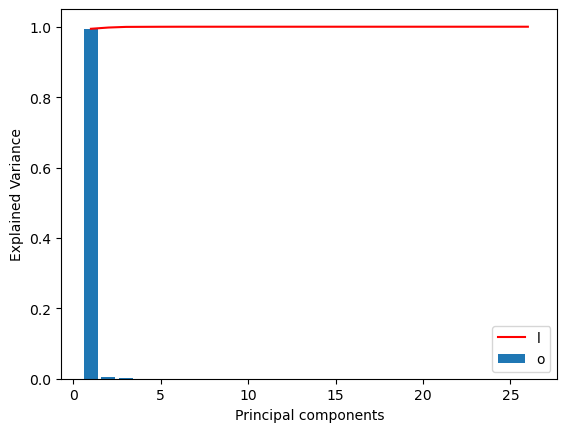

In [113]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1),pca.explained_variance_ratio_)
plt.ylabel('Explained Variance')
plt.xlabel('Principal components')
plt.plot(range(1,len(pca.explained_variance_ratio_)+1),np.cumsum(pca.explained_variance_ratio_),
         c='red',
         label='Cumulative Explained Variance')
plt.legend('lower left')

Text(0.5, 0, 'Principal components')

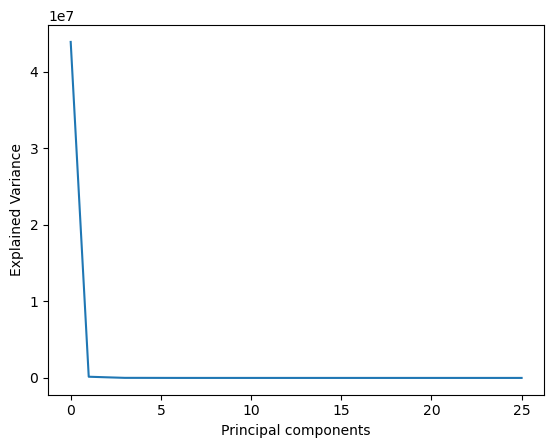

In [114]:
plt.plot(pca.explained_variance_)
plt.ylabel('Explained Variance')
plt.xlabel('Principal components')

In [115]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(df)

In [116]:
pca = PCA(n_components=2,random_state=42)
x_pca = pca.fit_transform(x_scaled)

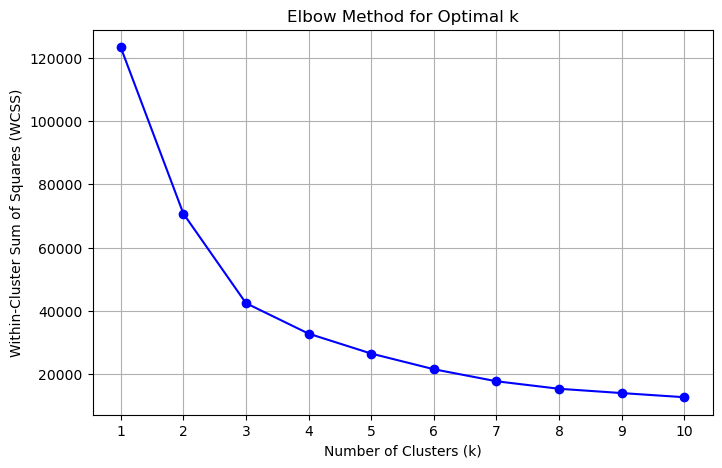

In [117]:
wcss = []
K_range = range(1, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(x_pca)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='-', color='b')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Within-Cluster Sum of Squares (WCSS)")
plt.title("Elbow Method for Optimal k")
plt.xticks(K_range)
plt.grid(True)
plt.show()

In [118]:
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
clusters=kmeans.fit_predict(x_pca)

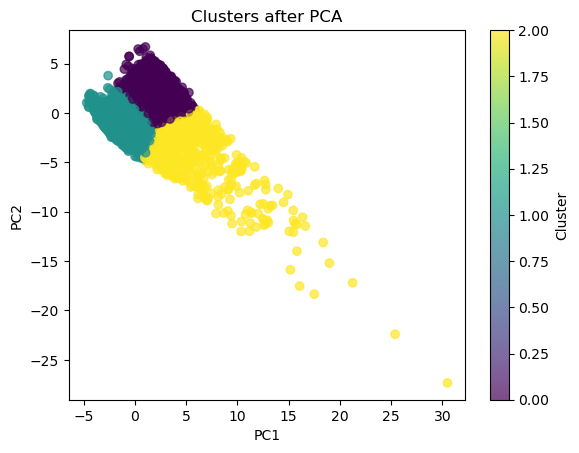

In [119]:
plt.scatter(x_pca[:, 0], x_pca[:, 1], c=clusters, cmap='viridis', alpha=0.7)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Clusters after PCA")
plt.colorbar(label="Cluster")
plt.show()


In [120]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(x_scaled)

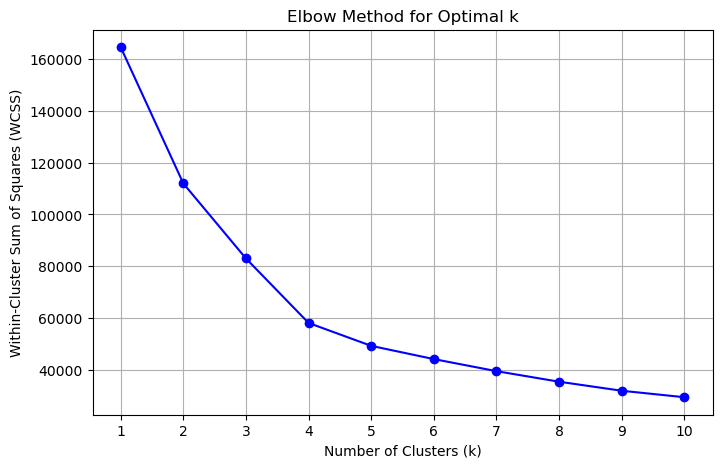

In [121]:
wcss = []
K_range = range(1, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(x_pca)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='-', color='b')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Within-Cluster Sum of Squares (WCSS)")
plt.title("Elbow Method for Optimal k")
plt.xticks(K_range)
plt.grid(True)
plt.show()

In [122]:
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
clusters = kmeans.fit_predict(x_pca)

In [123]:
new_df = pd.DataFrame(columns=["PC1", "PC2", "PC3"])

new_df["PC1"] = x_pca[:, 0]
new_df["PC2"] = x_pca[:, 1]
new_df["PC3"] = x_pca[:, 2]
new_df["Cluster"] =clusters

In [124]:
fig = plx.scatter_3d(new_df,
                     x="PC1",
                     y="PC2",
                     z="PC3",
                     color=new_df["Cluster"].astype(str),
                     title="3D PCA + K-Means Clustering",
                     opacity=0.8,
                     color_discrete_sequence=plx.colors.qualitative.Set1)
fig.update_traces(marker=dict(size=1))
fig.show()

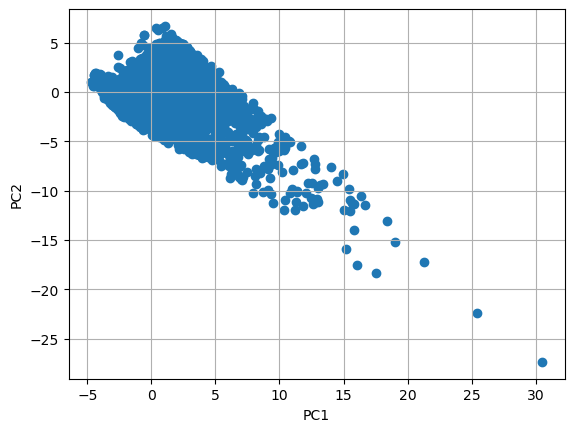

In [125]:
plt.scatter(new_df["PC1"], new_df["PC2"])
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.show()

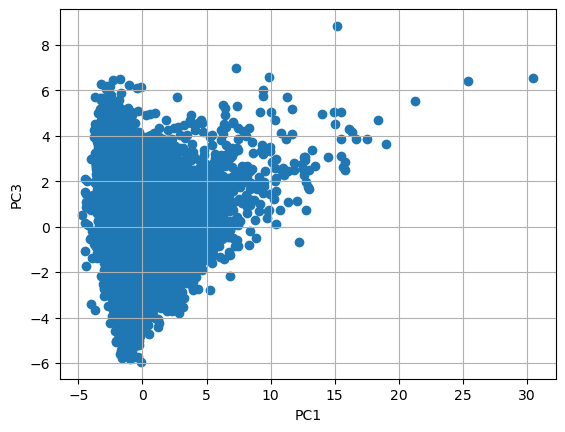

In [126]:
plt.scatter(new_df["PC1"], new_df["PC3"])
plt.xlabel("PC1")
plt.ylabel("PC3")
plt.grid(True)
plt.show()

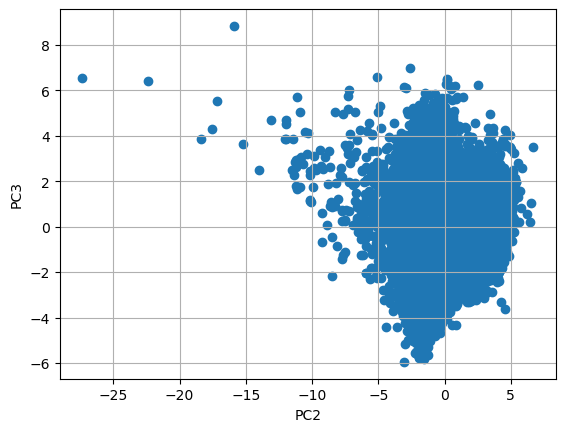

In [127]:
plt.scatter(new_df["PC2"], new_df["PC3"])
plt.xlabel("PC2")
plt.ylabel("PC3")
plt.grid(True)
plt.show()

In [128]:
new_df[(new_df["PC1"] < 20 ) & (new_df["PC2"] > -20)]

,PC1,PC2,PC3,Cluster
0,2.224384,-0.175323,-0.929979,1
1,1.480933,-0.968653,-1.124441,3
2,-0.558851,0.037296,-2.768856,3
3,6.242067,-4.592904,0.527635,2
4,-1.592683,-0.433799,-2.862448,3
...,...,...,...,...
10575,-1.894031,-0.941845,-1.158606,3
10576,2.371117,1.241899,0.583676,1
10577,3.015237,1.499679,-0.474964,1
10578,-2.288421,-0.923260,-2.144288,3


In [129]:
new_df = new_df[(new_df["PC1"] < 20) & (new_df["PC2"] > -20) & (new_df["PC3"] < 8)]
new_df

,PC1,PC2,PC3,Cluster
0,2.224384,-0.175323,-0.929979,1
1,1.480933,-0.968653,-1.124441,3
2,-0.558851,0.037296,-2.768856,3
3,6.242067,-4.592904,0.527635,2
4,-1.592683,-0.433799,-2.862448,3
...,...,...,...,...
10575,-1.894031,-0.941845,-1.158606,3
10576,2.371117,1.241899,0.583676,1
10577,3.015237,1.499679,-0.474964,1
10578,-2.288421,-0.923260,-2.144288,3


In [130]:
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
clusters = kmeans.fit_predict(new_df.drop("Cluster", axis=1))

In [131]:
new_df["Cluster"]=clusters

In [132]:
fig = plx.scatter_3d(new_df,
                     x="PC1",
                     y="PC2",
                     z="PC3",
                     color=new_df["Cluster"].astype(str),
                     title="3D PCA + K-Means Clustering",
                     opacity=0.8,
                     color_discrete_sequence=plx.colors.qualitative.Set1)
fig.update_traces(marker=dict(size=1))
fig.show()

In [133]:
new_df = new_df[(new_df["PC1"] < 20) & (new_df["PC2"] > -20) & (new_df["PC3"] < 8)]

In [134]:
eps_values = np.arange(0.2, 1.5, 0.1)
min_samples_values = range(3, 10)

best_params = None
best_score = -1

for eps, min_samples in product(eps_values, min_samples_values):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(new_df)

    score = silhouette_score(new_df, labels)
    if score > best_score:
        best_score = score
        print(f"score: {score}")
        best_params = {"eps": eps, "min_samples": min_samples}

print(f"Best parameters: {best_params}, Silhouette Score: {best_score:.4f}")


score: -0.4614890457657319
score: -0.3909792399877353
score: -0.34905218209569716
score: -0.3145594067556515
score: -0.1970708153861815
score: -0.1860520854010691
score: -0.12004567117364921
score: -0.0703560241007686
score: 0.005452417726468901
score: 0.07073046851257843
score: 0.1420841401386063
score: 0.16663889340775967
score: 0.28781773927719806
score: 0.31434306449837895
score: 0.3164140843089886
score: 0.322398022771354
score: 0.3655390361761737
score: 0.3888859853024622
score: 0.39112163980178566
score: 0.40340053969122824
score: 0.4038994317207709
score: 0.404027126956998
score: 0.4131884013787612
score: 0.41799260739014354
score: 0.5848293546305925
score: 0.6180616152485688
score: 0.6192255208540894
score: 0.6497731224339821
Best parameters: {'eps': np.float64(1.4000000000000004), 'min_samples': 4}, Silhouette Score: 0.6498


In [135]:
dbscan = DBSCAN(eps=best_params["eps"], min_samples=best_params["min_samples"])
labels = dbscan.fit_predict(new_df)

In [136]:
new_df["Cluster"] = labels

In [137]:
fig = plx.scatter_3d(new_df,
                     x="PC1",
                     y="PC2",
                     z="PC3",
                     color=new_df["Cluster"].astype(str),
                     title="3D PCA + DBSCAN Clustering",
                     opacity=0.8,
                     color_discrete_sequence=plx.colors.qualitative.Set1)

fig.update_traces(marker=dict(size=1))
fig.show()